1.   Messier 100 or NGC 4321 was discovered by the French astronomer Pierre Méchain in 1781.
2.   It is 56 million light years away from Earth.
3.   M100 is located in the constellation Coma Berenices.
4.   It is revealed as one of the giant spiral galaxy with star formation in the spiral arms
5.   Seven supernovae has been identified and white nebula.

1.  Based on the literature survey conducted this work is to prove the hypothesis- The Messier 100 is a spiral galaxy.

IMPORTING LIBRARY

In [ ]:
# General
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as mtpltcm
from mpl_toolkits.mplot3d import Axes3D
import random
import time

# Astronomical Library
from astropy.visualization import astropy_mpl_style
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
import astropy
from astropy import units as u 
import astropy.wcs as fitswcs
from astropy.cosmology import WMAP9 as Cosmology

# image Process
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage.morphology as morph
import skimage.exposure as skie
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

# Scaler & Transformation

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
import sklearn

from scipy.io.wavfile import read, write
import librosa
import librosa.display
import IPython
from IPython.display import Audio
import scipy
from scipy import signal
from scipy.fft import fftshift

#IGNORING WARNINGS

from warnings import filterwarnings

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)
filterwarnings("ignore", category=RuntimeWarning)

IMPORTING DATA

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!unzip /content/gdrive/MyDrive/GALAXIES_CENTER.zip

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Archive:  /content/gdrive/MyDrive/GALAXIES_CENTER.zip
replace M100/ISO/csli23500615.fits? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: M100/ISO/csli23500615.fits  
  inflating: M100/NEAR_INFRARED/idkv31030_drz.fits  
  inflating: M100/OPTICAL/hst_05195_01_wfpc2_f702w_pc_drz.fits  
  inflating: M100/XMM_Newton_Soft_Xray/P0106860201EPX0003COLIM8000.FTZ  
  inflating: M100/XMM_OM_Optical/P0106860201OMX000USIMAGU000.FTZ  
  inflating: M101/ISO/csli26902583.fits  
  inflating: M101/NEAR_INFRARED/hst_11080_a6_nic_nic3_f187n_drz.fits  
  inflating: M101/OPTICAL/hst_13361_03_wfc3_uvis_f502n_drz.fits  
  inflating: M101/XMM_Newton_Soft_Xray/P0164560701EPX0003COLIM8000.FTZ  
  inflating: M101/XMM_OM_Optical/P0212480201OMX000USIMAGU000.FTZ  
  inflating: M31/ISO/csp4000162201.fits  
  inflating: M31/NEAR_INFRARED/hst_7919_13_nic_nic3_f160w_drz.fits  
  inflati

READING DATA

In [ ]:
NEAR_INFRARED_PATH = "M100/NEAR_INFRARED/idkv31030_drz.fits"
HST_OPTICAL_PATH = "M100/OPTICAL/hst_05195_01_wfpc2_f702w_pc_drz.fits"
XMM_NEWTON_PATH = "M100/XMM_Newton_Soft_Xray/P0106860201EPX0003COLIM8000.FTZ"
XMM_OM_PATH = "M100/XMM_OM_Optical/P0106860201OMX000USIMAGU000.FTZ"
ISO_PATH = "M100/ISO/csli23500615.fits"

EXPLORATORY DATA ANALYSIS

In [ ]:
NI_OPEN = fits.open(NEAR_INFRARED_PATH)
HST_OPEN = fits.open(HST_OPTICAL_PATH)
XMM_NEWTON_OPEN = fits.open(XMM_NEWTON_PATH)
XMM_OM_OPEN = fits.open(XMM_OM_PATH)
ISO_OPEN = fits.open(ISO_PATH)

In [ ]:
OPEN_LIST = [NI_OPEN,HST_OPEN,XMM_NEWTON_OPEN,XMM_OM_OPEN,ISO_OPEN]
OPEN_NAME_LIST = ["NEAR_INFRARED","HST","NEWTON","OM","ISO"]

In [ ]:
for x_open,x_name in zip(OPEN_LIST,OPEN_NAME_LIST):
    print(x_name)
    print("---"*10)
    print(x_open.info())
    print("\n")

NEAR_INFRARED
------------------------------
Filename: M100/NEAR_INFRARED/idkv31030_drz.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     813   ()      
  1  SCI           1 ImageHDU        79   (1089, 962)   float32   
  2  WHT           1 ImageHDU        45   (1089, 962)   float32   
  3  CTX           1 ImageHDU        40   (1089, 962)   int32   
  4  HDRTAB        1 BinTableHDU    559   4R x 275C   [9A, 3A, K, D, D, D, D, D, D, D, D, D, D, D, D, K, 2A, 9A, 7A, 18A, D, D, D, D, D, 3A, D, D, D, D, D, D, D, D, D, D, D, D, K, K, D, 3A, D, D, D, D, K, K, 8A, 23A, 11A, 18A, 4A, D, D, K, K, D, D, D, D, 23A, D, D, D, D, K, K, D, 3A, 8A, L, D, D, D, 23A, 1A, D, D, D, D, D, D, 12A, 12A, 8A, 23A, D, D, 10A, 10A, D, D, D, 2A, 23A, 3A, 4A, 8A, 7A, D, K, D, 6A, 9A, D, D, D, 4A, 18A, 3A, K, 5A, D, D, D, 8A, D, 3A, D, D, D, 3A, 1A, D, 23A, D, D, D, 3A, L, 1A, 4A, D, 3A, 6A, D, D, D, D, D, 23A, D, D, D, D, D, 1A, K, K, K, K, 8A, 23A, K, K, 10A, 7

In [ ]:
NI_PRIMARY_OPERATION = NI_OPEN[0].header

In [ ]:
print(NI_PRIMARY_OPERATION.comments["TARGNAME"] + " ",NI_PRIMARY_OPERATION["TARGNAME"])

proposer's target name  NGC4321


In [ ]:
OM_PRIMARY = XMM_OM_OPEN[0].data
OM_EXPOSURE = XMM_OM_OPEN[1].data
OM_QUALITY = XMM_OM_OPEN[2].data

ZOOMED_SCALE_OM = OM_PRIMARY[370:1055,420:1070]
NUCLEUS_SCALE_OM = OM_PRIMARY[500:950,500:950]

DATA VISUALIZATION

In [ ]:
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral",
             "gist_ncar","gist_earth","gist_stern","flag","gnuplot2",'terrain']

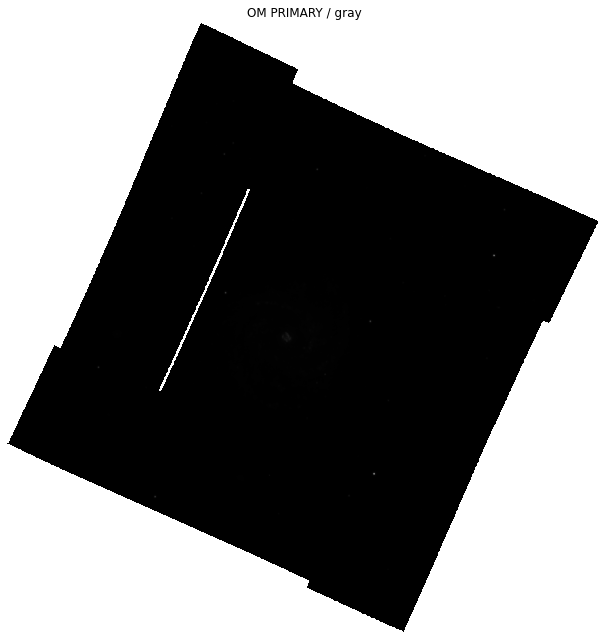

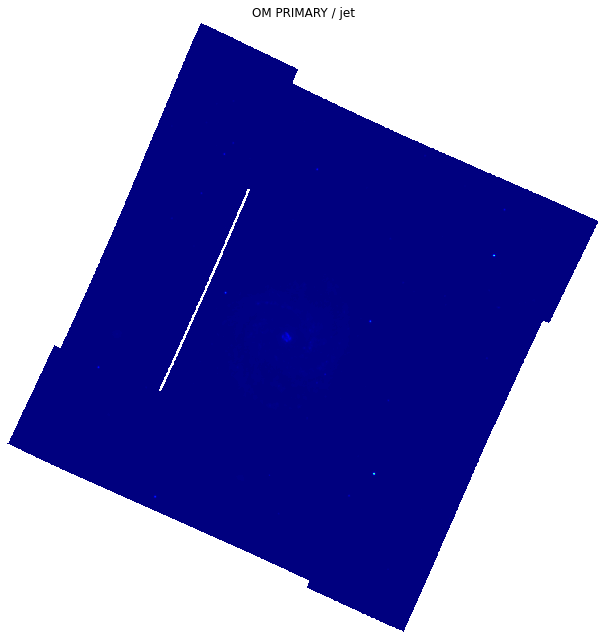

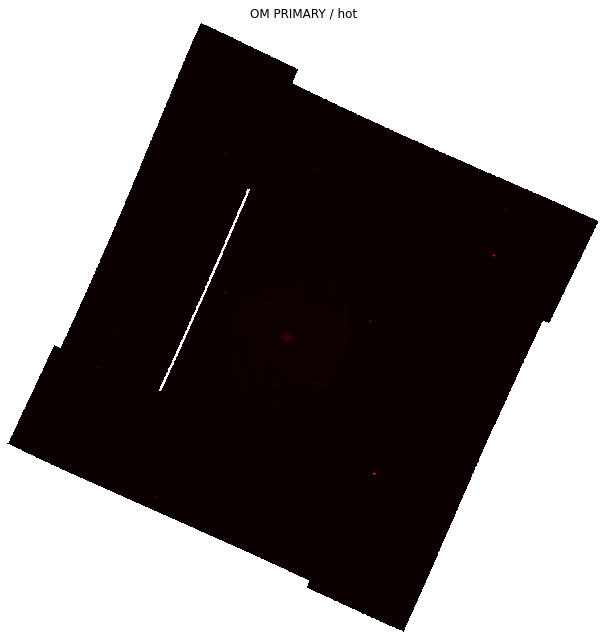

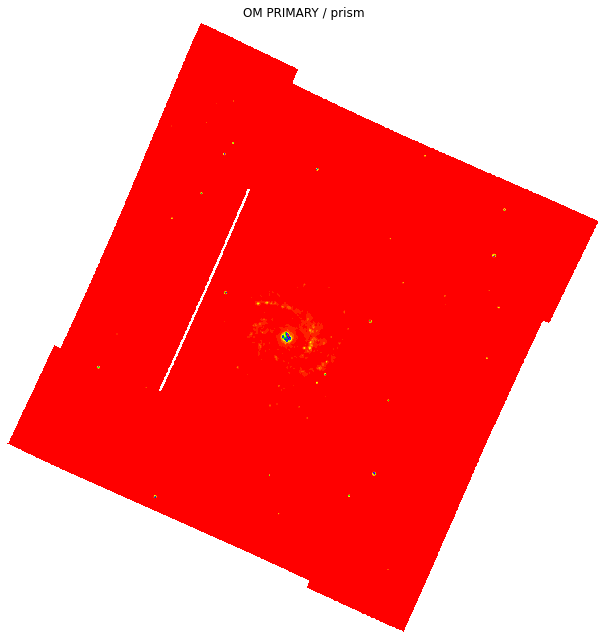

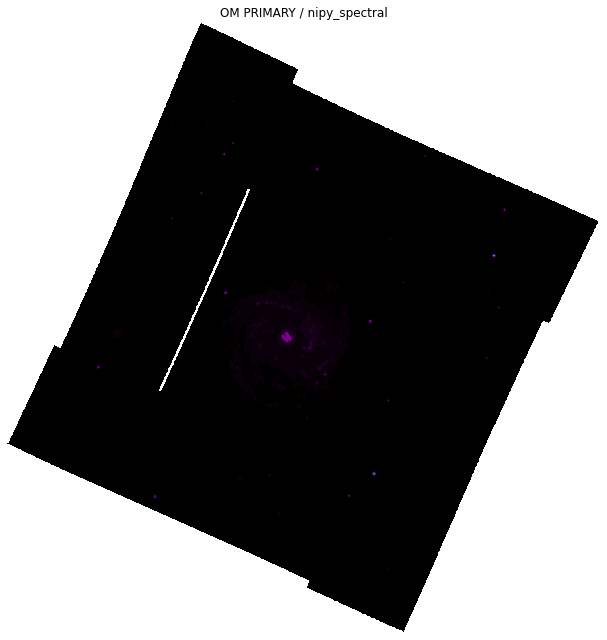

...

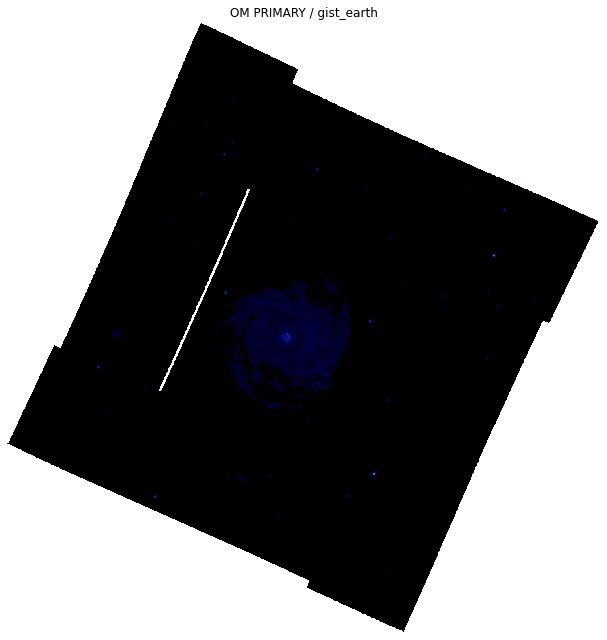

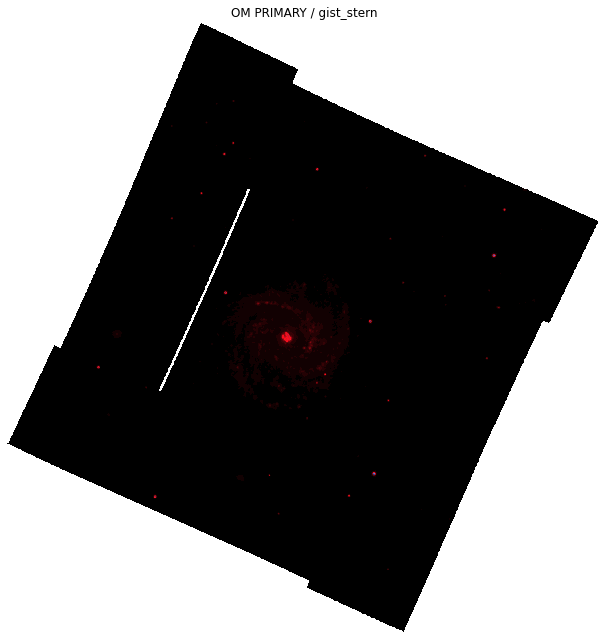

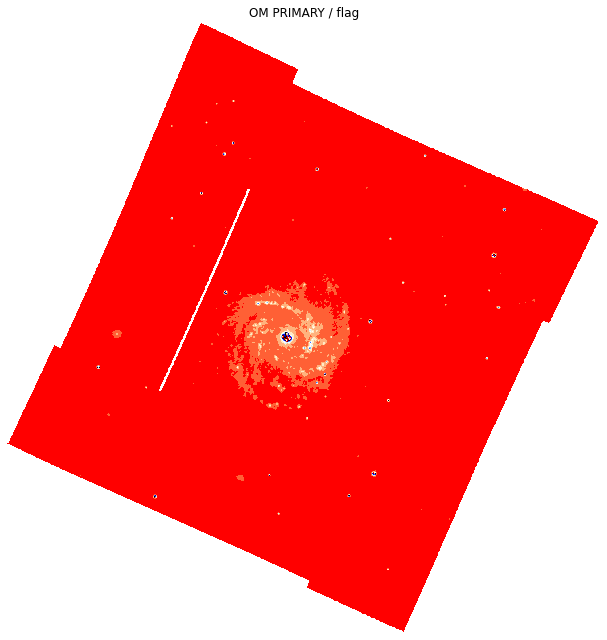

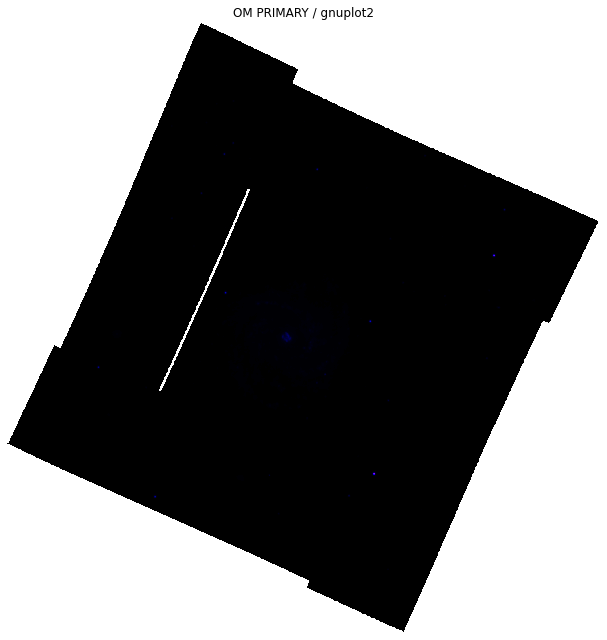

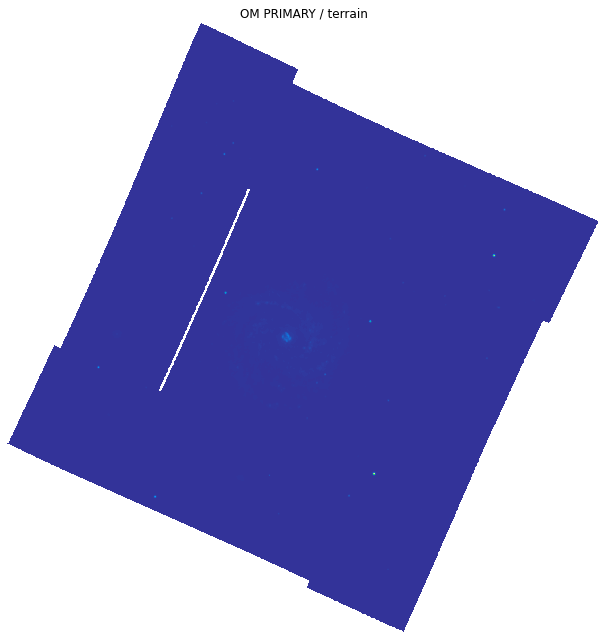

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure= plt.subplots(figsize=(9,9))
    
    plt.imshow(OM_PRIMARY / 255.,cmap=x_spec) #TARGET
    plt.title("OM PRIMARY" + " / "+ x_spec)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

INFERENCE

The FITZ Data of M100 is read and images obtained from different telescopes are visualized in different colormaps using several libraries.
From the visualization i could infere that the images from XMM_OM_Optical telescope provide a better visualization.


**FILTERS**

In [ ]:
# SATO
SATO_ZOOMED_SCALE_OM = filters.sato(ZOOMED_SCALE_OM)
SATO_NUCLEUS_SCALE_OM = filters.sato(NUCLEUS_SCALE_OM)

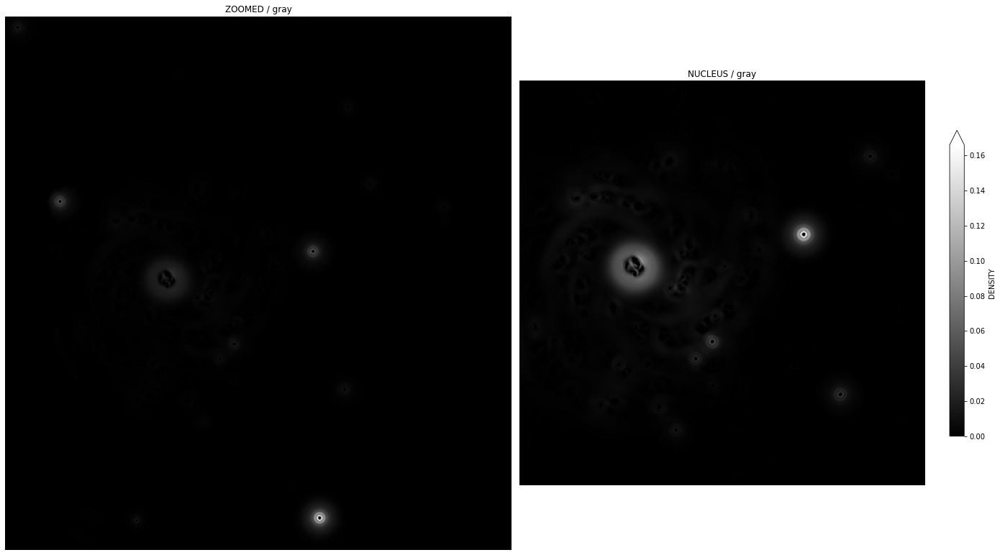

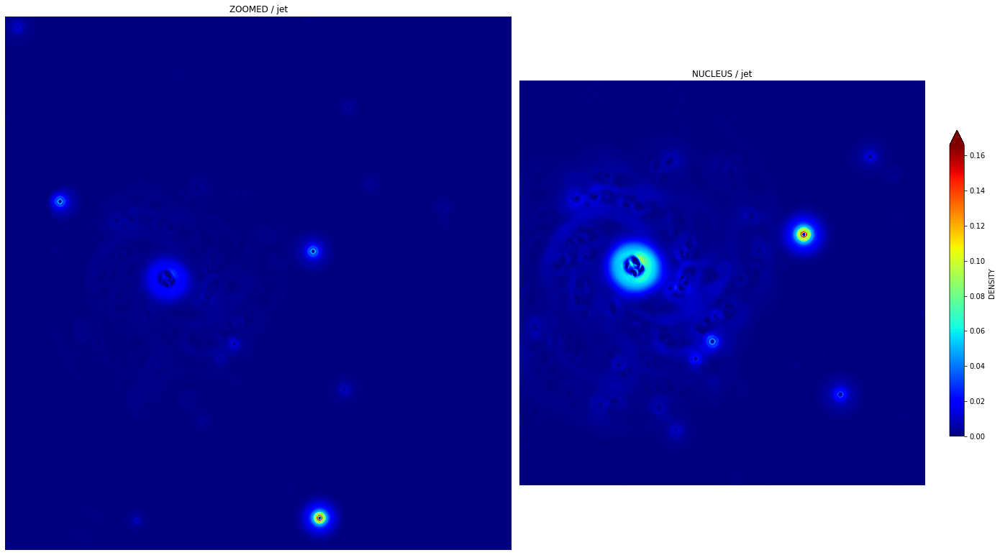

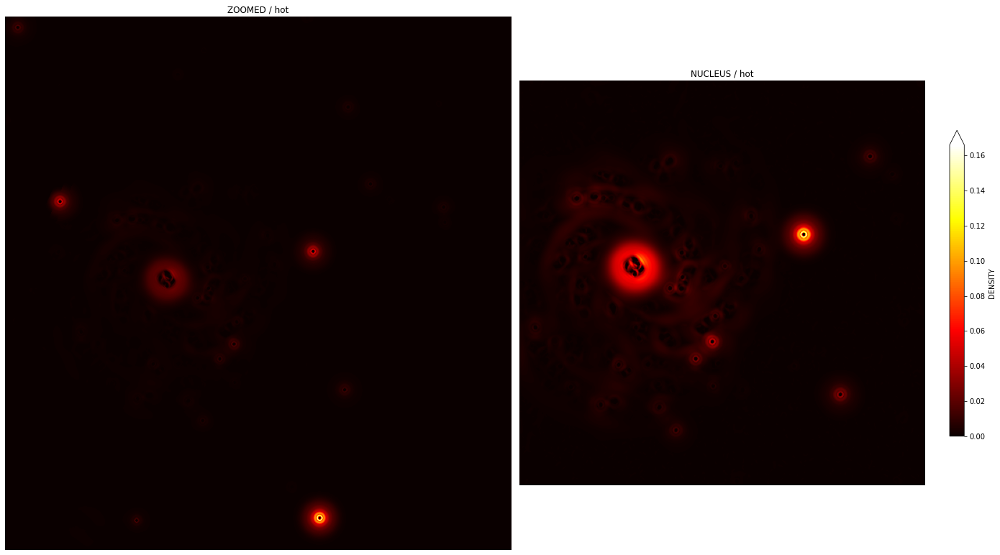

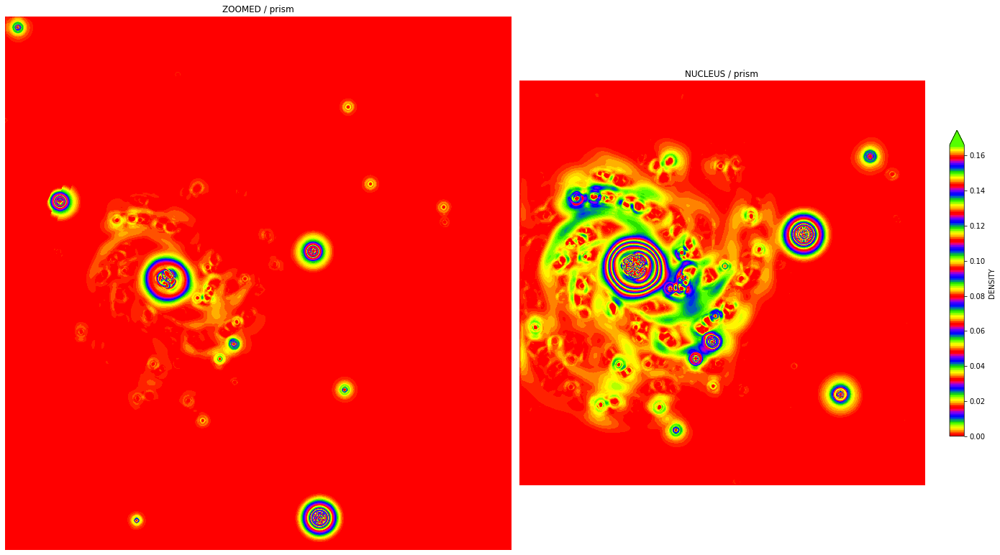

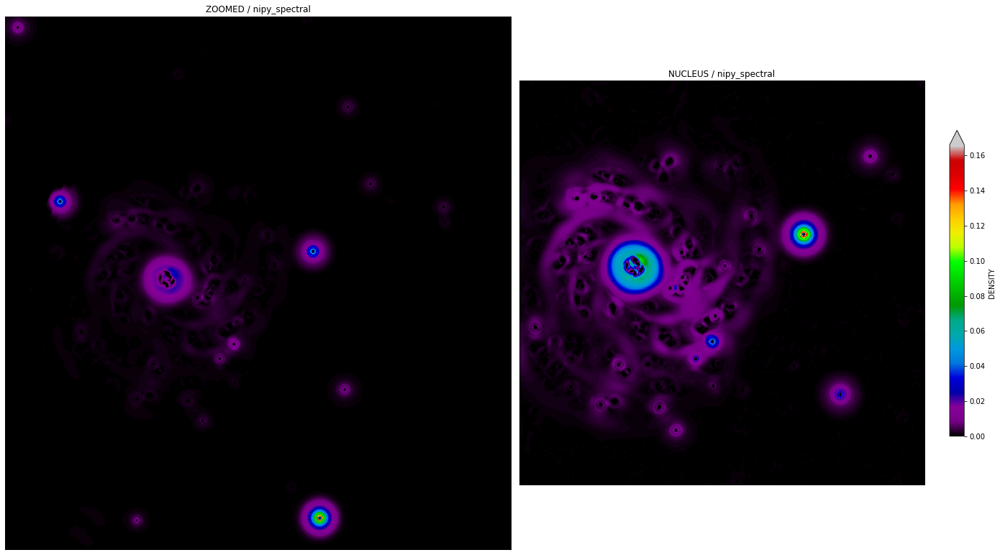

...

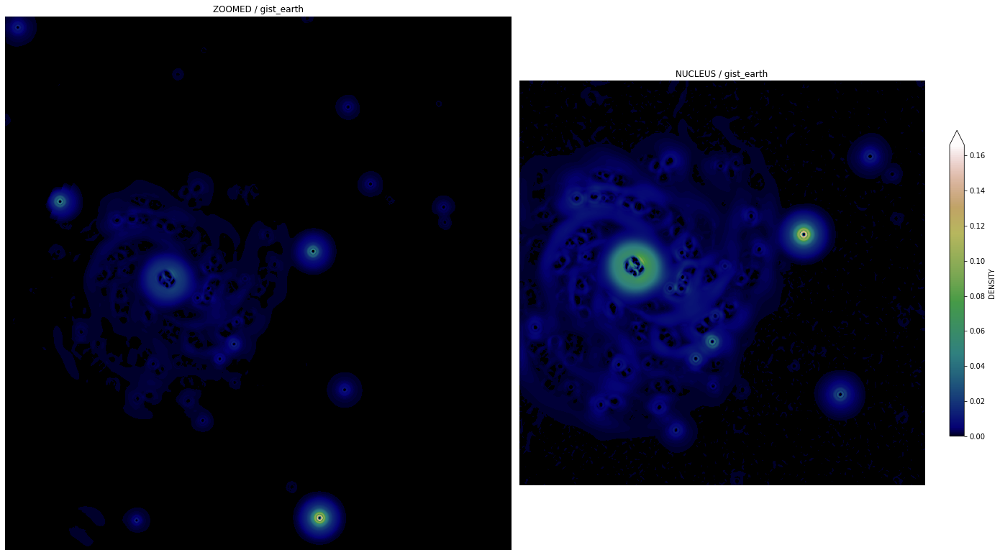

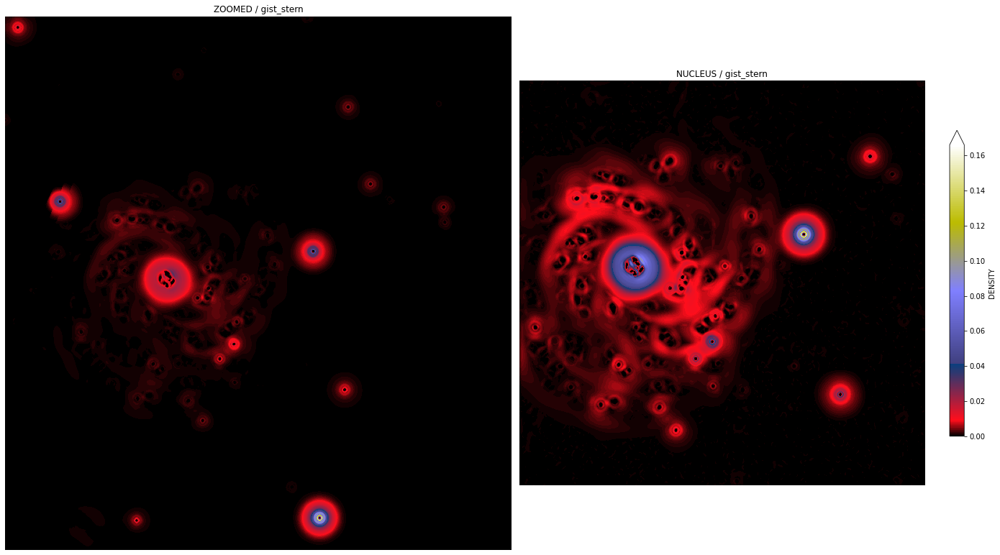

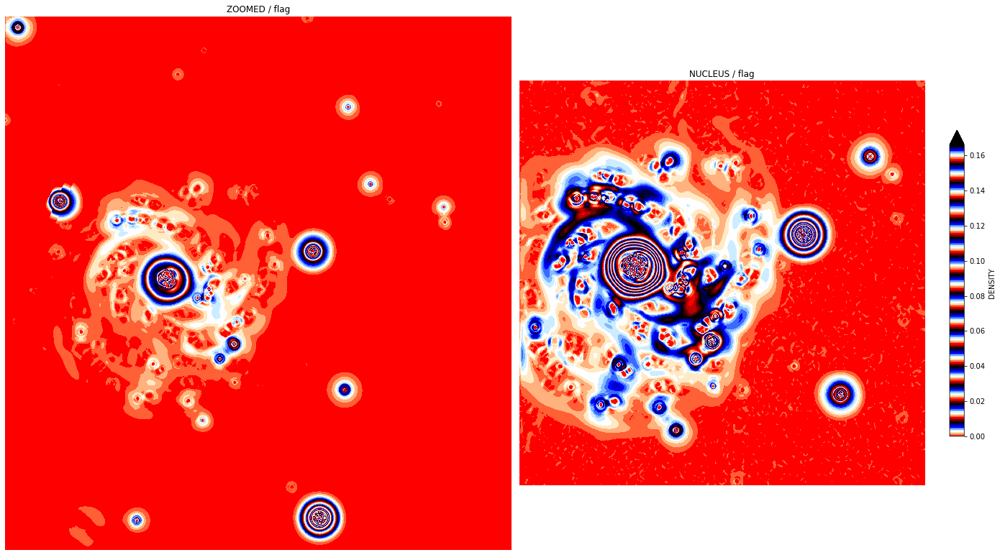

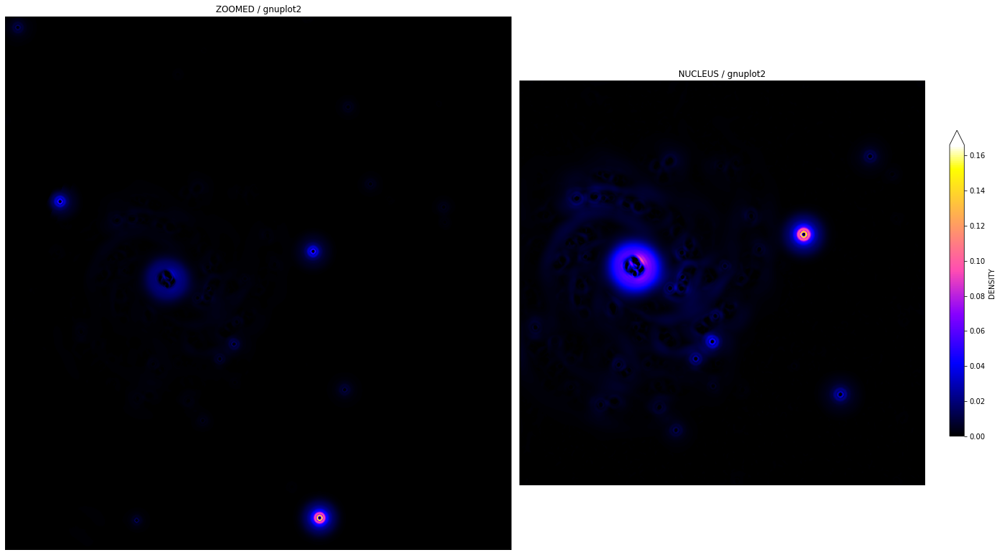

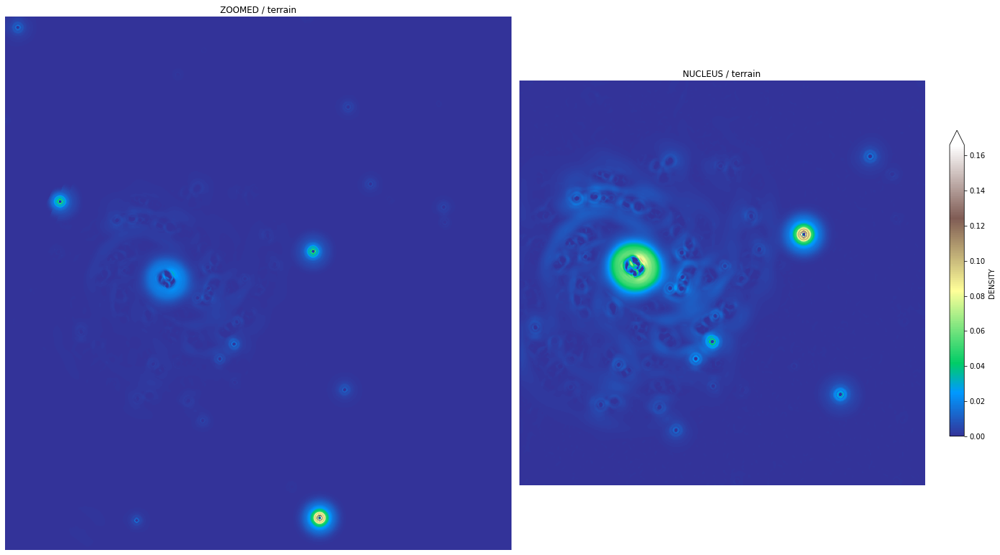

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(SATO_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(SATO_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

In [ ]:
# MEIJERING
M_ZOOMED_SCALE_OM = filters.meijering(ZOOMED_SCALE_OM)
M_NUCLEUS_SCALE_OM = filters.meijering(NUCLEUS_SCALE_OM)

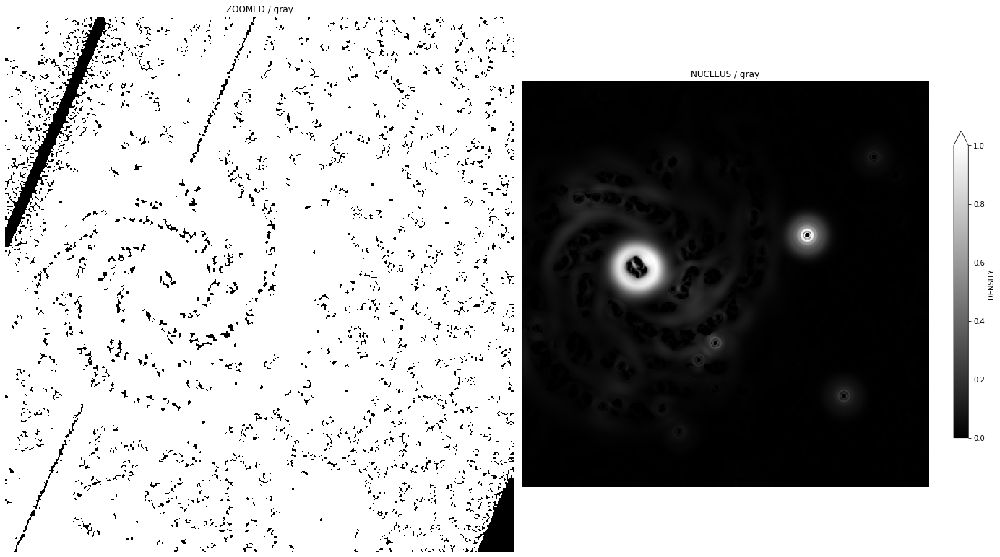

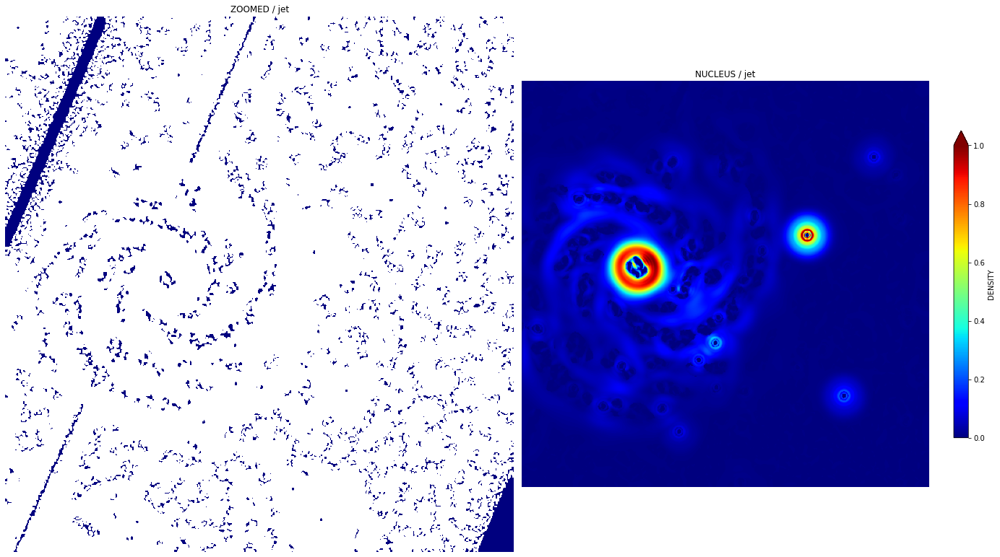

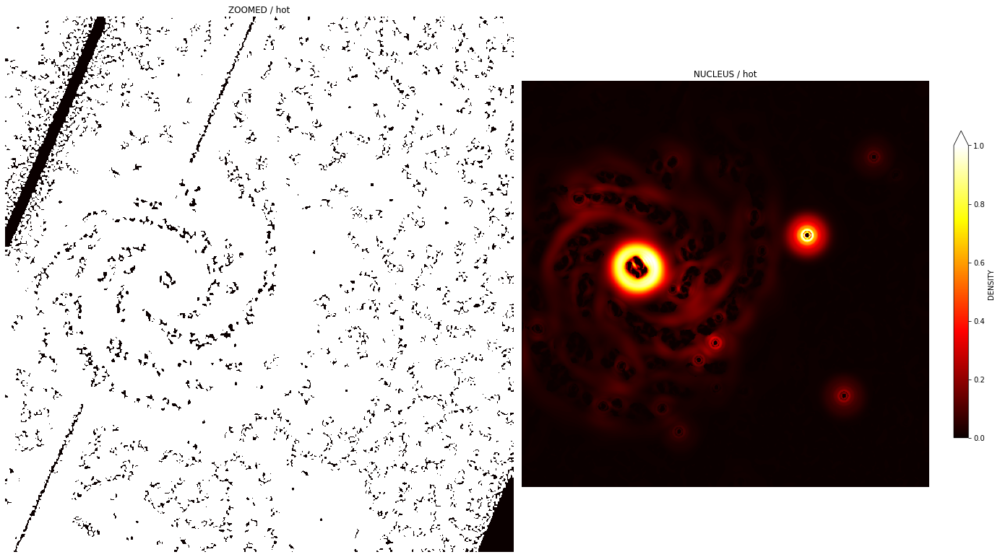

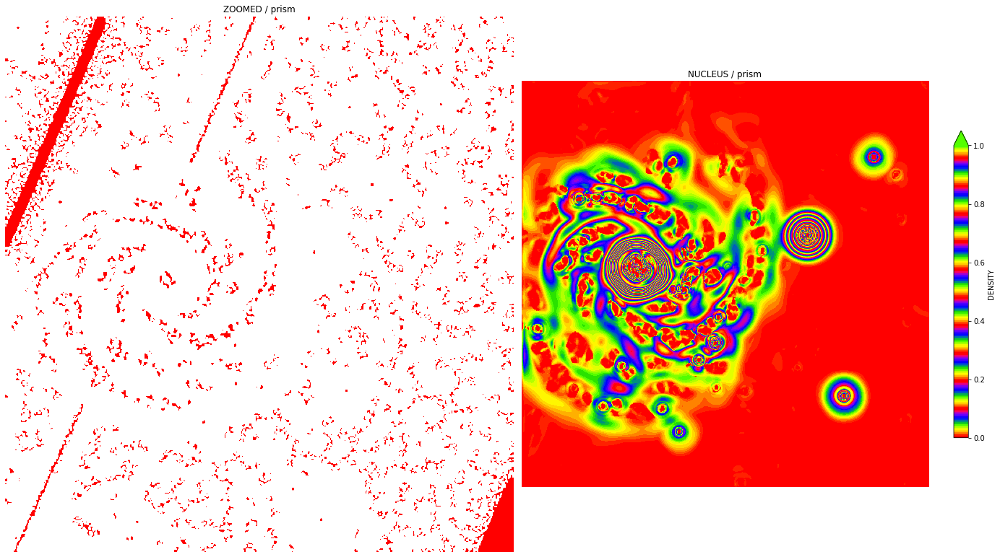

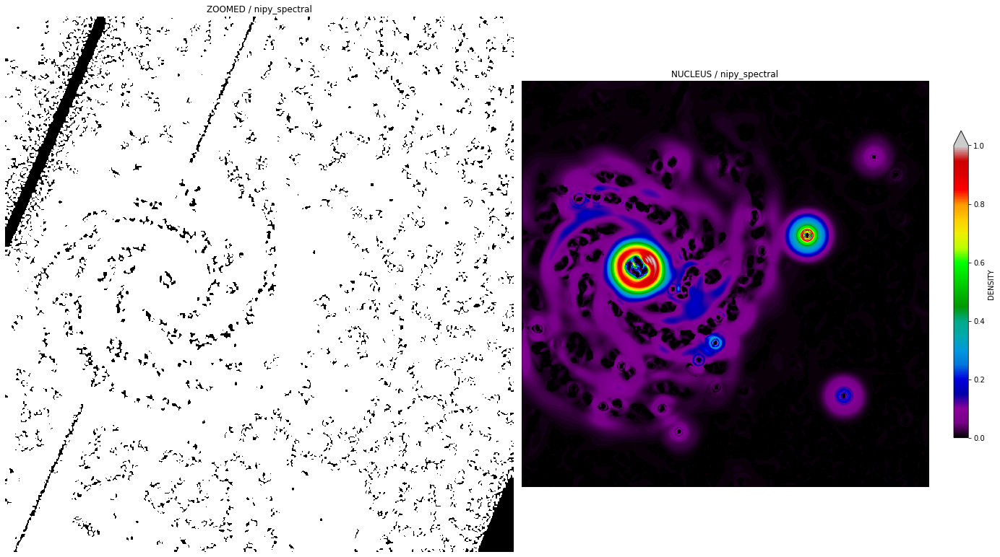

...

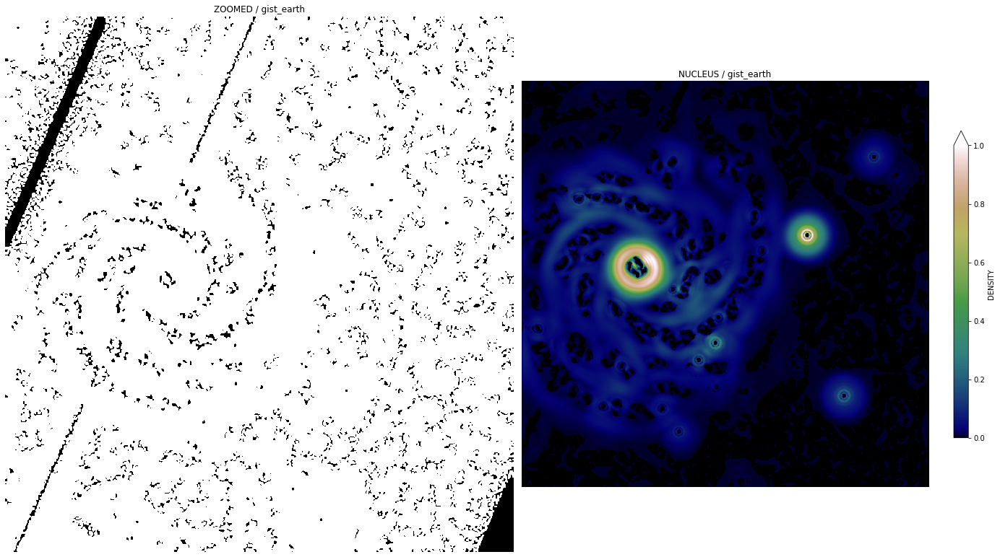

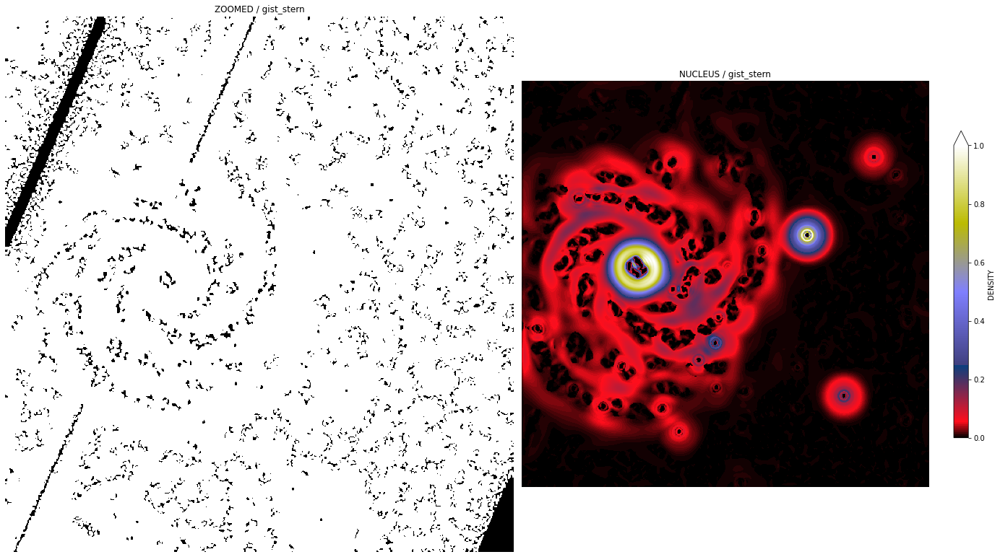

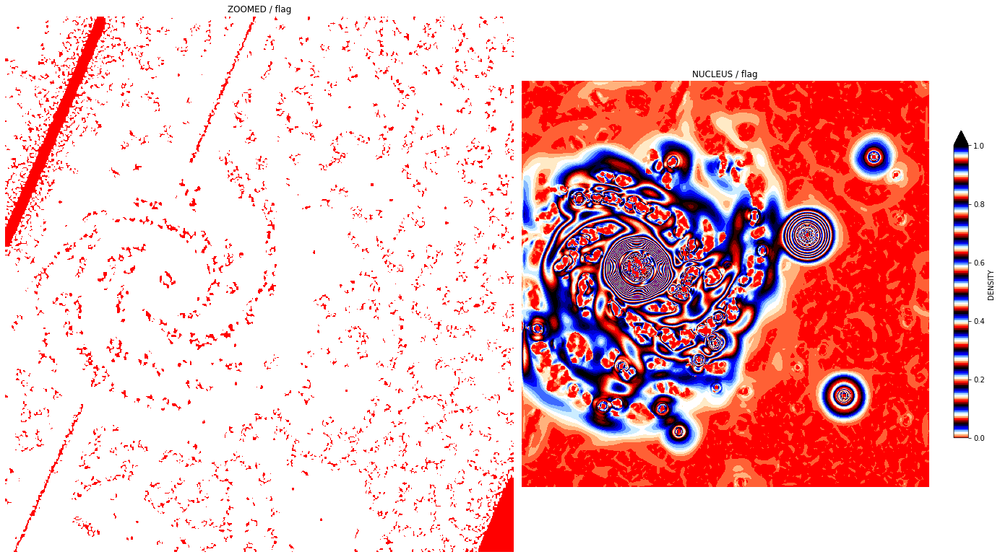

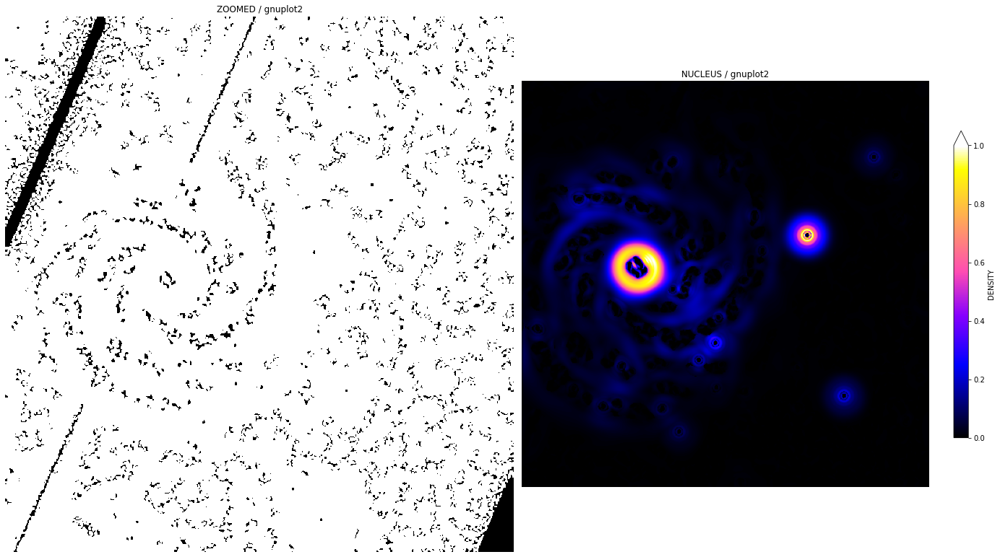

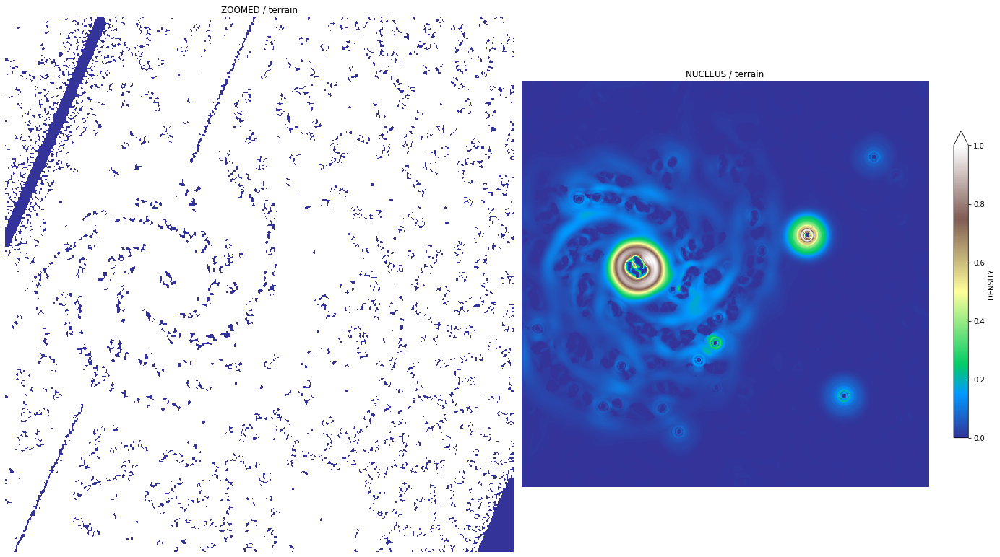

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
   
    axis[0].imshow(M_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(M_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

INFERENCE

For better visualization and fot better proof I used two most indicating filters to the OM_Optical images,SATO Filter and MEIJERING Filter.
Both filters provide a convincing explanation that the M100 is a spiral galaxy.It can be visualized clearly in filtered nulceus image.
The galaxy has a nucleus at the center and also other similar to nucleus images which are the bright stars in the spiral arms of galaxy.

FEATURE EXTRACTION

In [ ]:
FCF_ZOOMED_SCALE_OM = skimage.feature.corner_foerstner(ZOOMED_SCALE_OM)
FCF_NUCLEUS_SCALE_OM = skimage.feature.corner_foerstner(NUCLEUS_SCALE_OM)

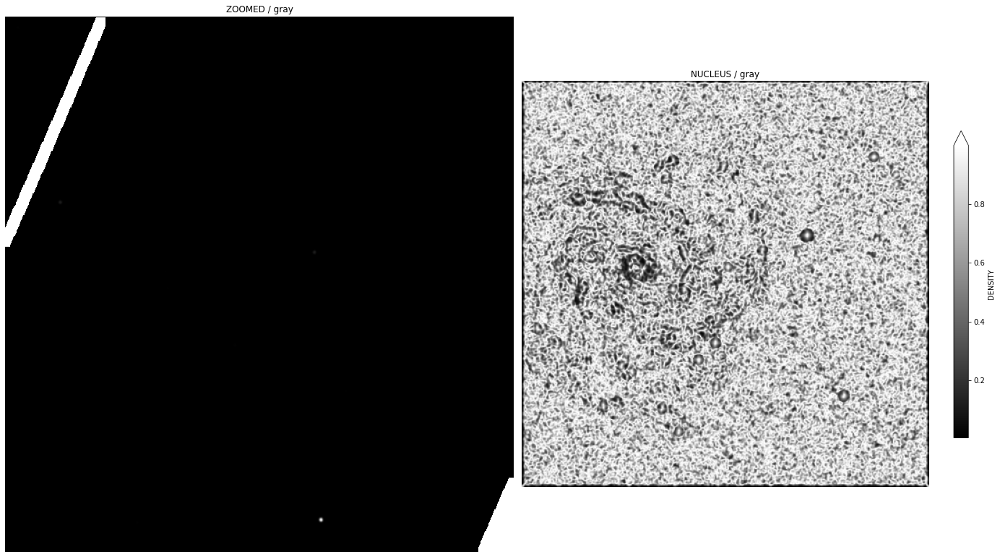

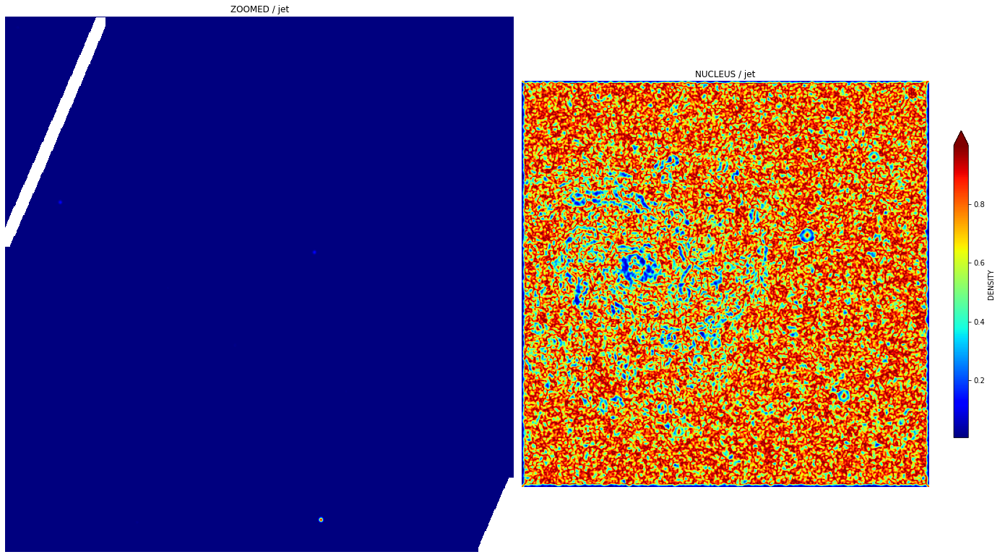

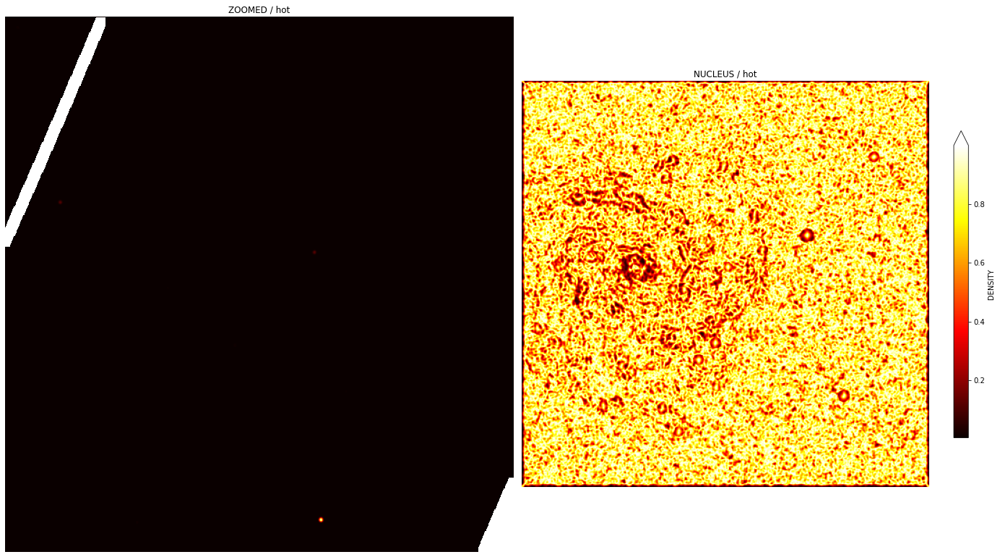

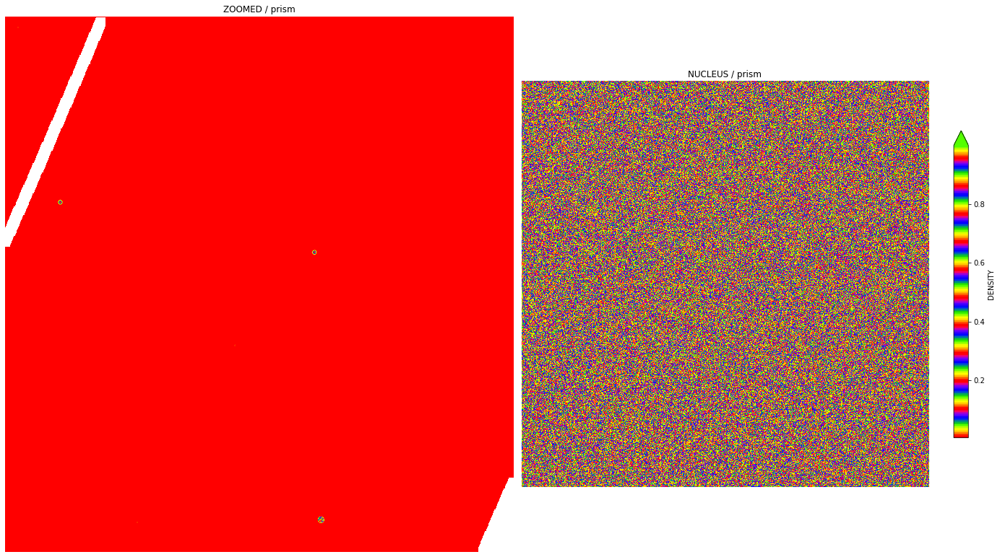

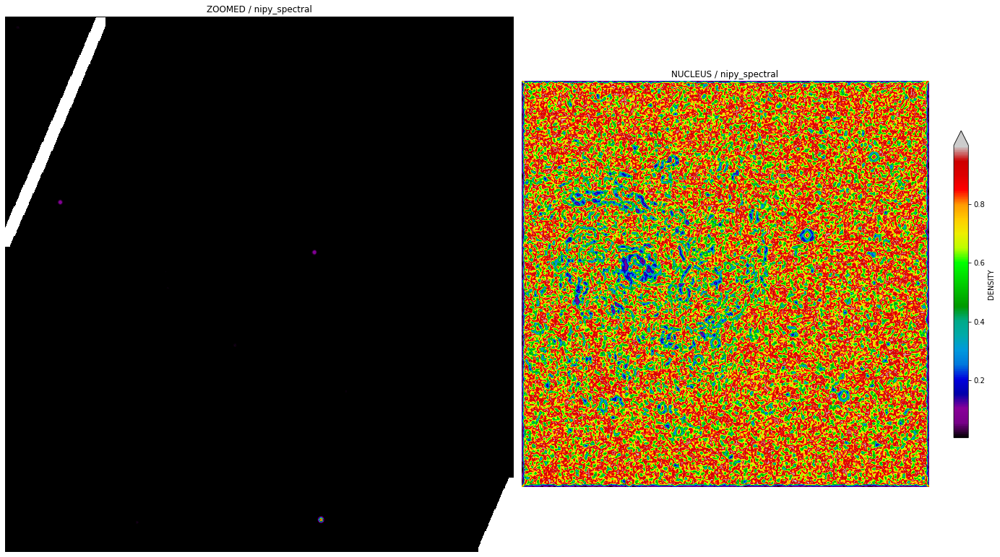

...

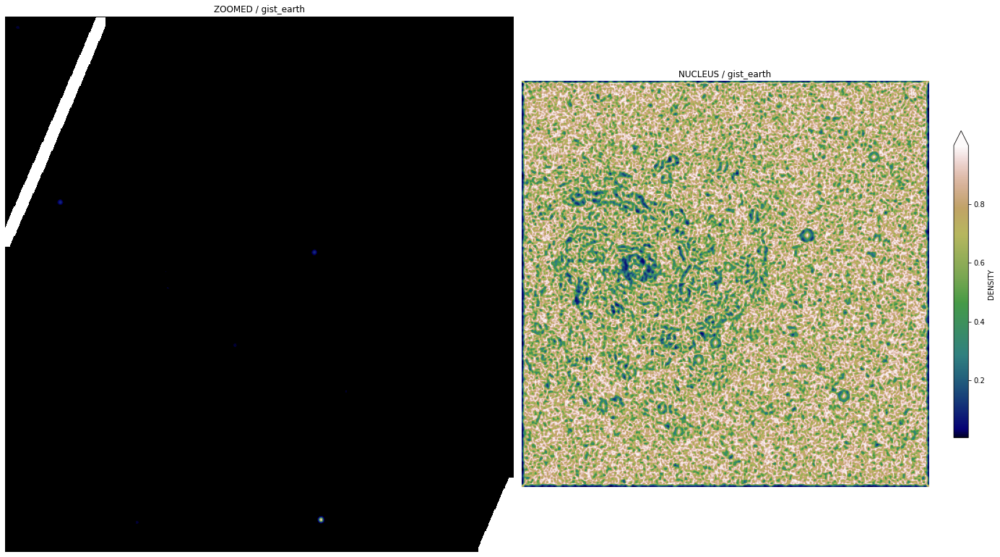

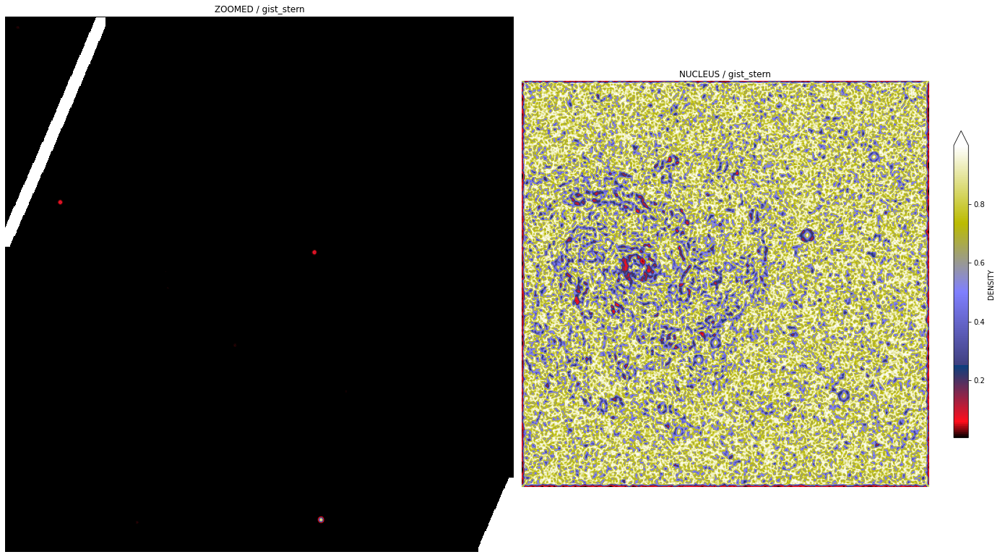

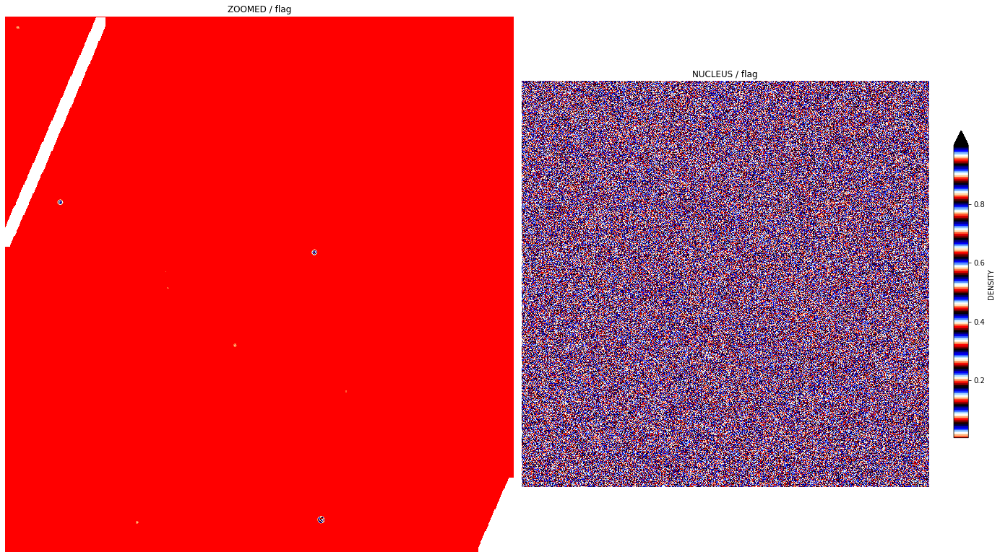

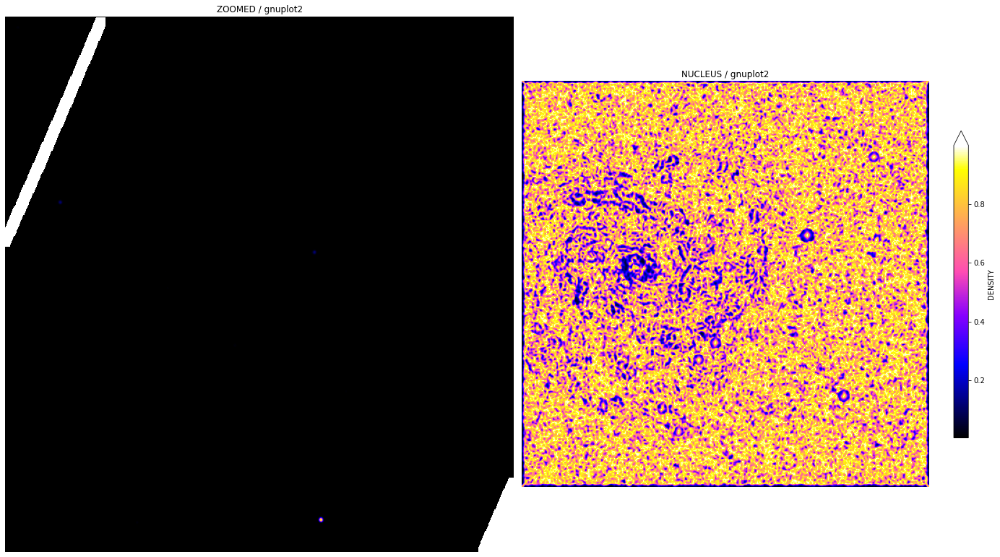

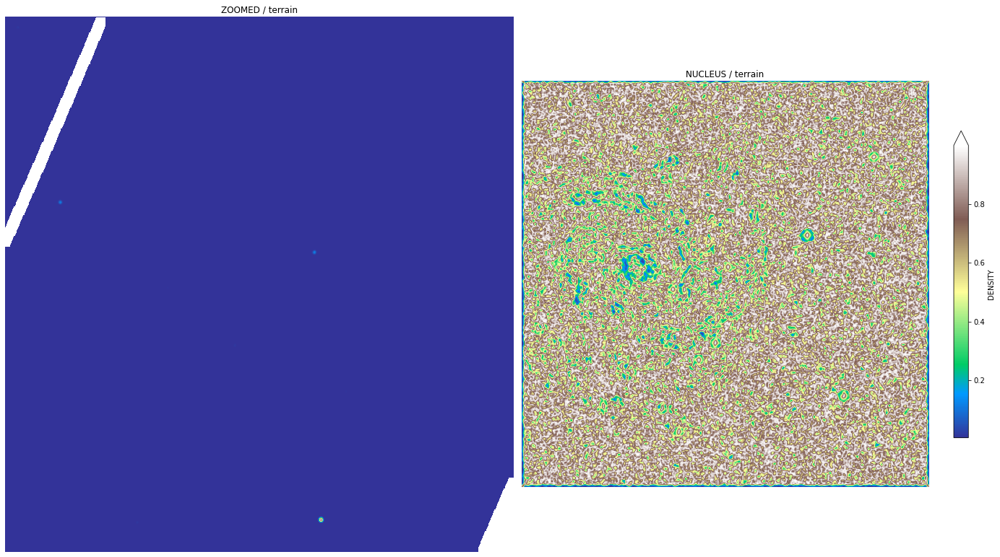

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(FCF_ZOOMED_SCALE_OM[0],cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(FCF_NUCLEUS_SCALE_OM[1],cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

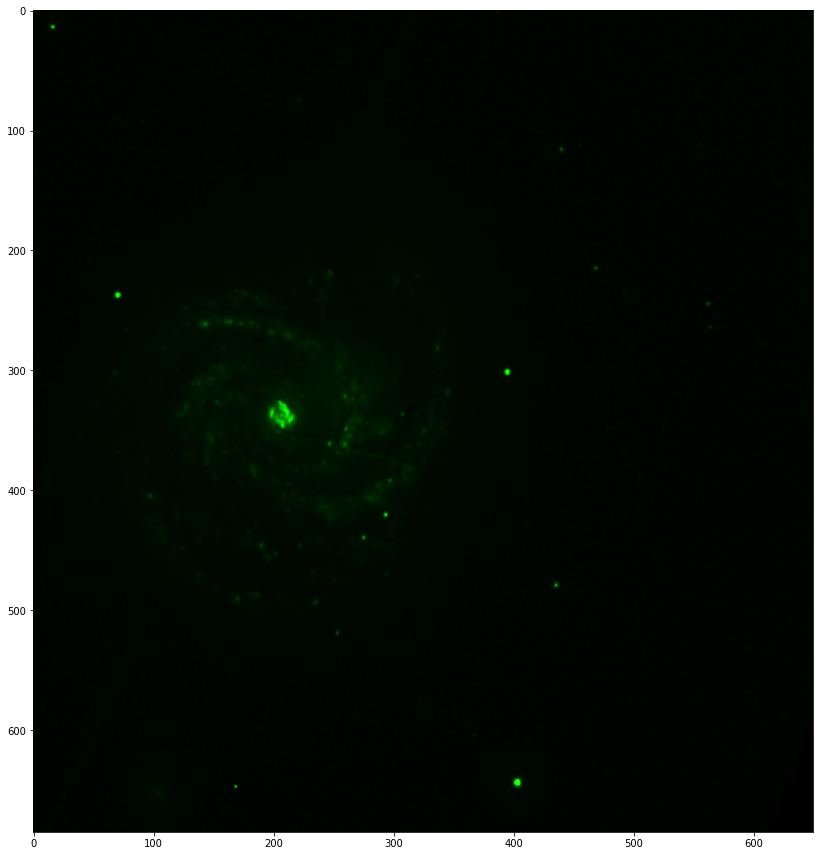

In [ ]:
figure = plt.figure(figsize=(12,12))
Picking_Image = ZOOMED_SCALE_OM
Spes_Color_IMG = np.dstack((Picking_Image*0.05, Picking_Image*1.5, Picking_Image*0.02))
plt.imshow(Spes_Color_IMG)
plt.tight_layout()
plt.show()

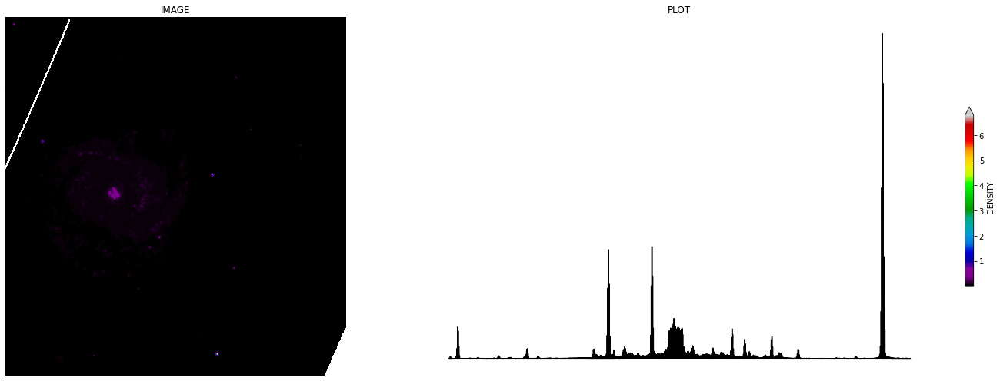

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(22,7))
    
DENSITY_FUNC = axis[0].imshow(ZOOMED_SCALE_OM,cmap="nipy_spectral")
axis[0].set_title("IMAGE")
axis[0].axis("off")
    
axis[1].plot(ZOOMED_SCALE_OM.flatten(),color="black")
axis[1].set_title("PLOT")
axis[1].axis("off")
    
figure.colorbar(DENSITY_FUNC,shrink=0.5,label="DENSITY",extend="max")
plt.tight_layout()
plt.show()

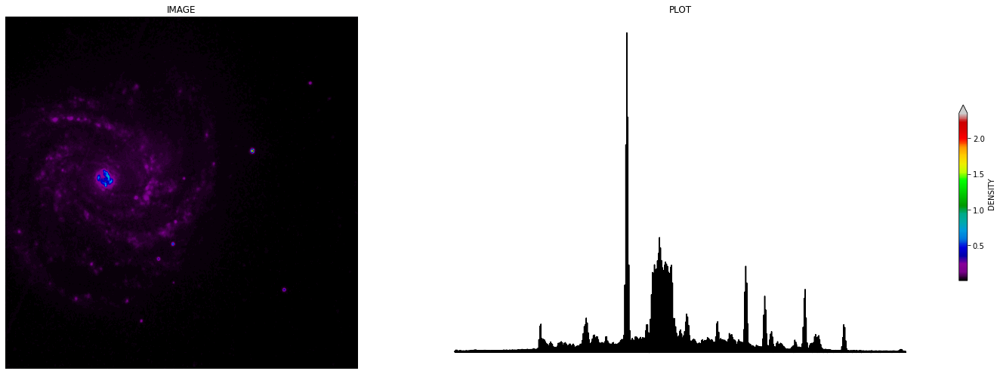

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(22,7))
    
DENSITY_FUNC = axis[0].imshow(NUCLEUS_SCALE_OM,cmap="nipy_spectral")
axis[0].set_title("IMAGE")
axis[0].axis("off")
    
axis[1].plot(NUCLEUS_SCALE_OM.flatten(),color="black")
axis[1].set_title("PLOT")
axis[1].axis("off")
    
figure.colorbar(DENSITY_FUNC,shrink=0.5,label="DENSITY",extend="max")
plt.tight_layout()
plt.show()

INFERENCE

*  After applying feature extraction,
flattening and applying histograms to plot the intensity of light variation I cound finally identify that the given data.

# Conclusion
*   M100 is a spiral galaxy




#Messier 100
1.The galaxy chosen for analysis was Messier 100, also known as NGC 4321.discovered by the French astronomer Pierre Méchain in 1781.M100 is located in the constellation Coma Berenices.

2.Messier 100 is considered a starburst galaxy with the strongest star formation activity concentrated in its center, within a ring – actually two tightly wound spiral arms attached to a small nuclear bar of radius: one thousand parsecs – where star formation has been taking place for at least 500 million years in separate bursts.56 million light years away from Earth and appears dim in the night sky. Its apparent magnitude of 10.1 means that, while it can be seen through small telescopes, it will appear only as a faint patch of light. Larger telescopes can resolve more details of this galaxy. M100 is located in the constellation Coma Berenices and is best observed during May.

3.messier 100 is a spixal galaxy.

4.The given data from different telescopes was read and visualized using the help of different libraries and for precise evidence and better visualization filters and feature extraction were applied and the image was shown with the help of histograms.Finally the hypothesis was proved that the Messier 100(NGC 4321) is a spiral galaxy.

5.M100 is a spiral galaxy with two spiral arms and bright stars at the arma and presence of black holes were seen.
